In [121]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import warnings
from sklearn.preprocessing import minmax_scale, StandardScaler
from sklearn.model_selection import train_test_split as tts
from scipy.stats import norm, gaussian_kde
from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN
from tqdm import tqdm
import plotly.express as px
import plotly.graph_objects as go
from sklearn.metrics import confusion_matrix,classification_report, multilabel_confusion_matrix
from scipy import stats

In [61]:
url = 'https://raw.githubusercontent.com/gourukarthikeyareddy/IE7374_StatisticalLearning/main/codon_usage.csv'
df = pd.read_csv(url)

<ipython-input-61-afabfb5fad6b>:2: DtypeWarning: Columns (5,6) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(url)


We know the following dataset information:

Column 1: Kingdom

Column 2: DNAtype

Column 3: SpeciesID

Column 4: Ncodons

Column 5: SpeciesName

Columns 6-69: codon (header: nucleotide bases; entries: frequency of usage (5 digit floating point number))

The 'Kingdom' is a 3-letter code corresponding to `xxx' in the CUTG database name: 'arc'(archaea), 'bct'(bacteria), 'phg'(bacteriophage), 'plm' (plasmid), 'pln' (plant), 'inv' (invertebrate), 'vrt' (vertebrate), 'mam' (mammal), 'rod' (rodent), 'pri' (primate), and 'vrl'(virus) sequence entries.  Note that the CUTG database does not contain 'arc' and 'plm' (these have been manually curated ourselves).

The 'DNAtype' is denoted as an integer for the genomic composition in the species: 0-genomic, 1-mitochondrial, 2-chloroplast, 3-cyanelle, 4-plastid, 5-nucleomorph, 6-secondary_endosymbiont, 7-chromoplast, 8-leucoplast, 9-NA, 10-proplastid, 11-apicoplast, and 12-kinetoplast.

The species identifier ('SpeciesID') is an integer, which uniquely indicates the entries of an organism. It is an accession identifier for each different species in the original CUTG database, followed by the first item listed in each genome.

The number of codons (`Ncodons') is the algebraic sum of the numbers listed for the different codons in an entry of CUTG. Codon frequencies are normalized to the total codon count, hence the number of occurrences divided by 'Ncodons' is the codon frequencies listed in the data file.

The species' name ('SpeciesName') is represented in strings purged of `comma' (which are now replaced by `space'). This is a descriptive label of the name of the species for data interpretations.

# FEATURE ENGINEERING

Let's first view our data

In [63]:
# Let's try to view our data at a glance
with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    describe_df = df.describe(include='all')

df

,Kingdom,DNAtype,SpeciesID,Ncodons,SpeciesName,UUU,UUC,UUA,UUG,CUU,...,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
0,vrl,0,100217,1995,Epizootic haematopoietic necrosis virus,0.01654,0.01203,0.00050,0.00351,0.01203,...,0.00451,0.01303,0.03559,0.01003,0.04612,0.01203,0.04361,0.00251,0.00050,0.00000
1,vrl,0,100220,1474,Bohle iridovirus,0.02714,0.01357,0.00068,0.00678,0.00407,...,0.00136,0.01696,0.03596,0.01221,0.04545,0.01560,0.04410,0.00271,0.00068,0.00000
2,vrl,0,100755,4862,Sweet potato leaf curl virus,0.01974,0.0218,0.01357,0.01543,0.00782,...,0.00596,0.01974,0.02489,0.03126,0.02036,0.02242,0.02468,0.00391,0.00000,0.00144
3,vrl,0,100880,1915,Northern cereal mosaic virus,0.01775,0.02245,0.01619,0.00992,0.01567,...,0.00366,0.01410,0.01671,0.03760,0.01932,0.03029,0.03446,0.00261,0.00157,0.00000
4,vrl,0,100887,22831,Soil-borne cereal mosaic virus,0.02816,0.01371,0.00767,0.03679,0.01380,...,0.00604,0.01494,0.01734,0.04148,0.02483,0.03359,0.03679,0.00000,0.00044,0.00131
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13023,pri,0,9601,1097,Pongo pygmaeus abelii,0.02552,0.03555,0.00547,0.01367,0.01276,...,0.00820,0.01367,0.01094,0.01367,0.02279,0.02005,0.04102,0.00091,0.00091,0.00638
13024,pri,1,9601,2067,mitochondrion Pongo pygmaeus abelii,0.01258,0.03193,0.01984,0.00629,0.01451,...,0.00145,0.00000,0.00048,0.00194,0.01306,0.01838,0.00677,0.00242,0.00097,0.01887
13025,pri,1,9602,1686,mitochondrion Pongo pygmaeus pygmaeus,0.01423,0.03321,0.01661,0.00356,0.01127,...,0.00000,0.00000,0.00000,0.00178,0.01661,0.02788,0.00297,0.00356,0.00119,0.02017
13026,pri,0,9606,40662582,Homo sapiens,0.01757,0.02028,0.00767,0.01293,0.01319,...,0.01142,0.01217,0.01196,0.02178,0.02510,0.02896,0.03959,0.00099,0.00079,0.00156


Null Value check

### There are various ways in which we can check for the discrepancies in our dataset. Let's do it by finding out all the missing values

In [64]:
# Number of columns with null values
(df.isnull().sum() > 0).sum()

0

In [65]:
print(df.isnull().any().any())
#No null values

False


Handling Empty String Values

In [66]:
df.replace('', np.nan, inplace=True)
df

,Kingdom,DNAtype,SpeciesID,Ncodons,SpeciesName,UUU,UUC,UUA,UUG,CUU,...,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
0,vrl,0,100217,1995,Epizootic haematopoietic necrosis virus,0.01654,0.01203,0.00050,0.00351,0.01203,...,0.00451,0.01303,0.03559,0.01003,0.04612,0.01203,0.04361,0.00251,0.00050,0.00000
1,vrl,0,100220,1474,Bohle iridovirus,0.02714,0.01357,0.00068,0.00678,0.00407,...,0.00136,0.01696,0.03596,0.01221,0.04545,0.01560,0.04410,0.00271,0.00068,0.00000
2,vrl,0,100755,4862,Sweet potato leaf curl virus,0.01974,0.0218,0.01357,0.01543,0.00782,...,0.00596,0.01974,0.02489,0.03126,0.02036,0.02242,0.02468,0.00391,0.00000,0.00144
3,vrl,0,100880,1915,Northern cereal mosaic virus,0.01775,0.02245,0.01619,0.00992,0.01567,...,0.00366,0.01410,0.01671,0.03760,0.01932,0.03029,0.03446,0.00261,0.00157,0.00000
4,vrl,0,100887,22831,Soil-borne cereal mosaic virus,0.02816,0.01371,0.00767,0.03679,0.01380,...,0.00604,0.01494,0.01734,0.04148,0.02483,0.03359,0.03679,0.00000,0.00044,0.00131
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13023,pri,0,9601,1097,Pongo pygmaeus abelii,0.02552,0.03555,0.00547,0.01367,0.01276,...,0.00820,0.01367,0.01094,0.01367,0.02279,0.02005,0.04102,0.00091,0.00091,0.00638
13024,pri,1,9601,2067,mitochondrion Pongo pygmaeus abelii,0.01258,0.03193,0.01984,0.00629,0.01451,...,0.00145,0.00000,0.00048,0.00194,0.01306,0.01838,0.00677,0.00242,0.00097,0.01887
13025,pri,1,9602,1686,mitochondrion Pongo pygmaeus pygmaeus,0.01423,0.03321,0.01661,0.00356,0.01127,...,0.00000,0.00000,0.00000,0.00178,0.01661,0.02788,0.00297,0.00356,0.00119,0.02017
13026,pri,0,9606,40662582,Homo sapiens,0.01757,0.02028,0.00767,0.01293,0.01319,...,0.01142,0.01217,0.01196,0.02178,0.02510,0.02896,0.03959,0.00099,0.00079,0.00156


In [67]:
(df.isnull().sum() > 0).sum()
# We have no NA/NaN values in our dataset

0

In [69]:
# Checking Data Consistency
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13028 entries, 0 to 13027
Data columns (total 69 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Kingdom      13028 non-null  object 
 1   DNAtype      13028 non-null  int64  
 2   SpeciesID    13028 non-null  int64  
 3   Ncodons      13028 non-null  int64  
 4   SpeciesName  13028 non-null  object 
 5   UUU          13028 non-null  object 
 6   UUC          13028 non-null  object 
 7   UUA          13028 non-null  float64
 8   UUG          13028 non-null  float64
 9   CUU          13028 non-null  float64
 10  CUC          13028 non-null  float64
 11  CUA          13028 non-null  float64
 12  CUG          13028 non-null  float64
 13  AUU          13028 non-null  float64
 14  AUC          13028 non-null  float64
 15  AUA          13028 non-null  float64
 16  AUG          13028 non-null  float64
 17  GUU          13028 non-null  float64
 18  GUC          13028 non-null  float64
 19  GUA 

In [70]:
#Lets see the rows which make UUU and UUC non numeric rows
NNR = df[pd.to_numeric(df['UUU'], errors='coerce').isna() | pd.to_numeric(df['UUC'], errors='coerce').isna()]
NNR

# We can just drop these rows to make our dataset consistent

,Kingdom,DNAtype,SpeciesID,Ncodons,SpeciesName,UUU,UUC,UUA,UUG,CUU,...,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
486,vrl,0,12440,1238,Non-A,non-B hepatitis virus,0.04362,0.0210,0.01292,0.01292,...,0.00081,0.00323,0.00242,0.00162,0.04443,0.01696,0.02423,0.02262,0.00162,0.00000
5063,bct,0,353569,1698,Salmonella enterica subsp. enterica serovar 4,12;I,-,0.0212,0.02356,0.01178,...,0.03062,0.00118,0.00707,0.00118,0.00000,0.02945,0.02356,0.04476,0.02473,0.00118


In [71]:
df = df.drop(df[df['SpeciesID']==12440].index)
df = df.drop(df[df['SpeciesID']==353569].index)
df['UUU'] = df['UUU'].astype(float)
df['UUC'] = df['UUC'].astype(float)

In [ ]:
df.describe()
#Let's also see data at glance numerically

,DNAtype,SpeciesID,Ncodons,UUU,UUC,UUA,UUG,CUU,CUC,CUA,...,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
count,13026.000000,13026.000000,1.302600e+04,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000,...,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000,13026.000000
mean,0.367265,130443.036926,7.961776e+04,0.024818,0.023440,0.020637,0.014104,0.017821,0.018287,0.019045,...,0.005453,0.009930,0.006423,0.024181,0.021164,0.028291,0.021683,0.001640,0.000590,0.006179
std,0.688764,124777.067741,7.197556e+05,0.017628,0.011598,0.020710,0.009280,0.010587,0.014573,0.024252,...,0.006601,0.008574,0.006388,0.013826,0.013039,0.014343,0.015019,0.001785,0.000882,0.010345
min,0.000000,7.000000,1.000000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,28851.250000,1.602000e+03,0.013910,0.015380,0.005610,0.007103,0.010890,0.007830,0.005302,...,0.001220,0.001690,0.001170,0.012390,0.011860,0.017360,0.009710,0.000560,0.000000,0.000410
50%,0.000000,81971.500000,2.929000e+03,0.021750,0.021905,0.015260,0.013360,0.016130,0.014560,0.009680,...,0.003530,0.009270,0.004545,0.025425,0.019070,0.026085,0.020540,0.001380,0.000420,0.001130
75%,1.000000,222890.500000,9.120000e+03,0.031308,0.029210,0.029495,0.019808,0.022730,0.025110,0.017255,...,0.007150,0.015928,0.010250,0.034190,0.027690,0.036800,0.031128,0.002370,0.000830,0.002890
max,12.000000,465364.000000,4.066258e+07,0.217300,0.091690,0.151330,0.101190,0.089780,0.100350,0.163920,...,0.055540,0.098830,0.058430,0.185660,0.113840,0.144890,0.158550,0.045200,0.025610,0.106700


In [72]:
num_cols = df.select_dtypes(include='number').columns
num_cols_count = len(num_cols)
cols_per_row = 3
num_rows = (num_cols_count - 1) // cols_per_row + 1

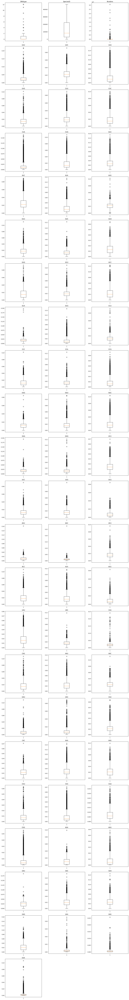

In [74]:
total_subplots = num_rows * cols_per_row
num_cols_count = len(num_cols)

fig, axes = plt.subplots(nrows=num_rows, ncols=cols_per_row, figsize=(15, 5 * num_rows))
axes = axes.flatten()

for i, col in enumerate(num_cols):
    if i < total_subplots:
        ax = axes[i]
        ax.boxplot(df[col])
        ax.set_title(col)
    else:
        break

for j in range(num_cols_count, total_subplots):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

##UNIVARIATIVE ANALYSIS

In [77]:



cols_to_scale = df.select_dtypes(include=np.number).columns

# Columns to exclude
cols_to_exclude = ['DNAtype', 'SpeciesID', 'Ncodons']

# Combine excluded columns with numerical columns
desired_index = list(cols_to_exclude) + [col for col in cols_to_scale if col not in cols_to_exclude]

# Creating a DataFrame with the desired index
output_index = pd.Index(desired_index, name='Index')
print(output_index)

Index(['DNAtype', 'SpeciesID', 'Ncodons', 'UUU', 'UUC', 'UUA', 'UUG', 'CUU',
       'CUC', 'CUA', 'CUG', 'AUU', 'AUC', 'AUA', 'AUG', 'GUU', 'GUC', 'GUA',
       'GUG', 'GCU', 'GCC', 'GCA', 'GCG', 'CCU', 'CCC', 'CCA', 'CCG', 'UGG',
       'GGU', 'GGC', 'GGA', 'GGG', 'UCU', 'UCC', 'UCA', 'UCG', 'AGU', 'AGC',
       'ACU', 'ACC', 'ACA', 'ACG', 'UAU', 'UAC', 'CAA', 'CAG', 'AAU', 'AAC',
       'UGU', 'UGC', 'CAU', 'CAC', 'AAA', 'AAG', 'CGU', 'CGC', 'CGA', 'CGG',
       'AGA', 'AGG', 'GAU', 'GAC', 'GAA', 'GAG', 'UAA', 'UAG', 'UGA'],
      dtype='object', name='Index')


In [79]:
cols_to_scale = [col for col in df.columns if col not in cols_to_exclude]

# Scaling selected numeric columns only
for col in cols_to_scale:
    if df[col].dtype in ['int64', 'float64']:
        df[col] = minmax_scale(df[col])

# Creating a DataFrame with the scaled columns only
df_filtered = df[cols_to_scale]

In [80]:
df_filtered
df_filtered['Kingdom'] = df['Kingdom'] # ADD BACK FOR UNIVARIATIVE ANALYSIS

<ipython-input-80-5f6407b6008d>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_filtered['Kingdom'] = df['Kingdom'] # ADD BACK FOR UNIVARIATIVE ANALYSIS


In [81]:
df_filtered.tail(2)

,Kingdom,SpeciesName,UUU,UUC,UUA,UUG,CUU,CUC,CUA,CUG,...,CGG,AGA,AGG,GAU,GAC,GAA,GAG,UAA,UAG,UGA
13026,pri,Homo sapiens,0.080856,0.221180,0.050684,0.127779,0.146915,0.195217,0.043619,0.369191,...,0.205618,0.123141,0.204689,0.117311,0.220485,0.199876,0.249700,0.021903,0.030847,0.01462
13027,pri,mitochondrion Homo sapiens,0.081822,0.406151,0.114452,0.059294,0.188127,0.384056,0.427038,0.121822,...,0.014944,0.004149,0.007017,0.024292,0.123155,0.113949,0.049385,0.034513,0.044514,0.20253


In [82]:
df_filtered['Kingdom'].unique()

array(['vrl', 'arc', 'bct', 'phg', 'plm', 'pln', 'inv', 'vrt', 'mam',
       'rod', 'pri'], dtype=object)

In [83]:
features = df.columns[5:].values
print(features)

['UUU' 'UUC' 'UUA' 'UUG' 'CUU' 'CUC' 'CUA' 'CUG' 'AUU' 'AUC' 'AUA' 'AUG'
 'GUU' 'GUC' 'GUA' 'GUG' 'GCU' 'GCC' 'GCA' 'GCG' 'CCU' 'CCC' 'CCA' 'CCG'
 'UGG' 'GGU' 'GGC' 'GGA' 'GGG' 'UCU' 'UCC' 'UCA' 'UCG' 'AGU' 'AGC' 'ACU'
 'ACC' 'ACA' 'ACG' 'UAU' 'UAC' 'CAA' 'CAG' 'AAU' 'AAC' 'UGU' 'UGC' 'CAU'
 'CAC' 'AAA' 'AAG' 'CGU' 'CGC' 'CGA' 'CGG' 'AGA' 'AGG' 'GAU' 'GAC' 'GAA'
 'GAG' 'UAA' 'UAG' 'UGA']


In [84]:
dict_class = {    'arc': 0, 'bct': 1, 'phg': 2, 'plm': 3,
                    'pln': 4, 'inv': 5, 'vrt': 6, 'mam': 7,
                    'rod': 8, 'pri': 9, 'vrl':10
                }

df['Kingdom'] = df['Kingdom'].map(dict_class)

In [85]:
df2 = df.iloc[:,:].copy()
df2.drop(['DNAtype', 'SpeciesName', 'SpeciesID', 'Ncodons'], axis=1, inplace=True)

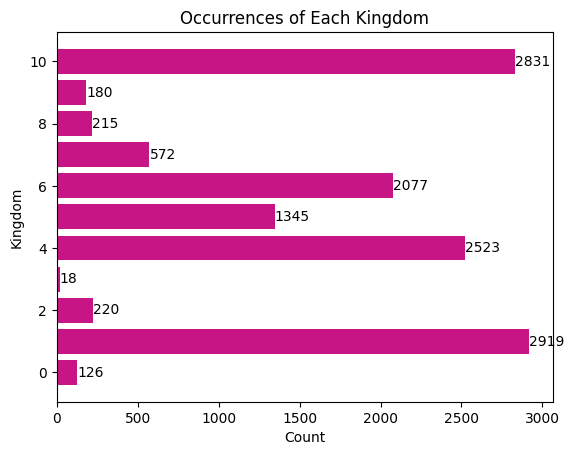

In [86]:
kingdom_counts = df.groupby('Kingdom').size().reset_index(name='Count')
kingdom_counts = kingdom_counts.sort_values(by='Count', ascending=True)
bar_color = 'mediumvioletred'
fig, ax = plt.subplots()
bars = ax.barh(kingdom_counts['Kingdom'], kingdom_counts['Count'], color=bar_color)
for bar in bars:
    yval = bar.get_y() + bar.get_height() / 2
    xval = bar.get_width()
    ax.text(xval, yval, round(xval, 1), va='center', ha='left')
ax.set_xlabel('Count')
ax.set_ylabel('Kingdom')
ax.set_title('Occurrences of Each Kingdom')
plt.show()

In [88]:
def hist_plot(feature,  classes='Kingdom'):
    sns.displot(data=df, x=feature, hue=classes)
    plt.title(feature)
    plt.show()



def boxplot_plot(feature, classes='Kingdom', axes=None):
    sns.boxplot(x=classes, y=feature, data=df, ax=axes)
    plt.title(feature)
    plt.show()

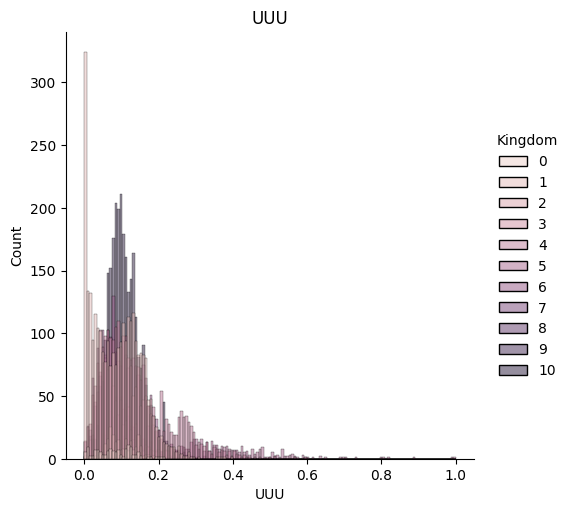

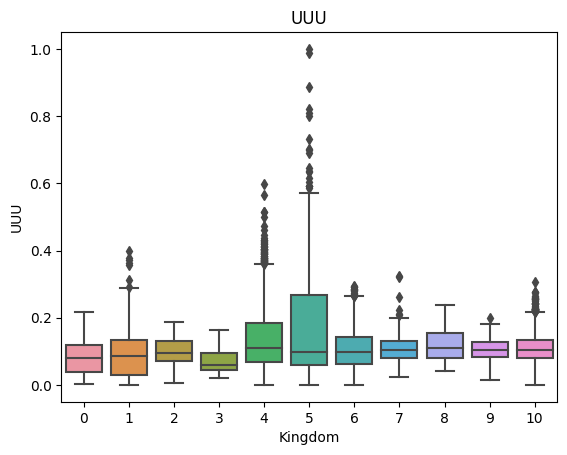

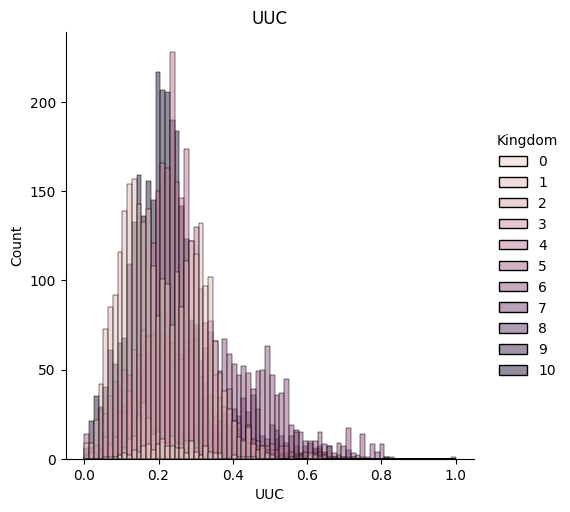

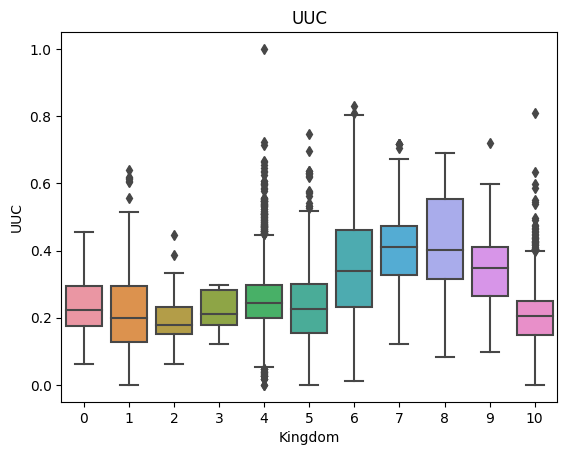

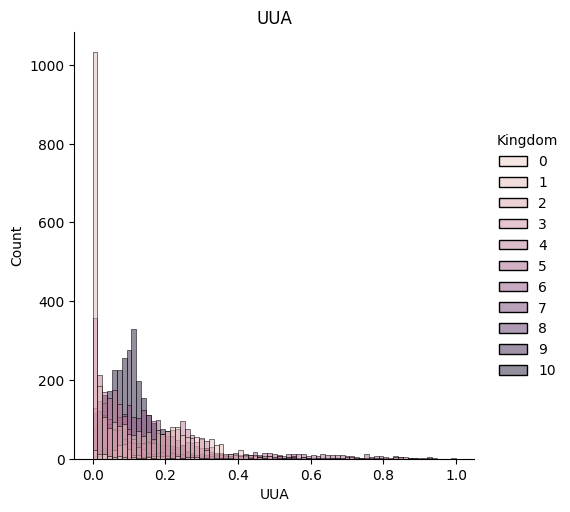

...

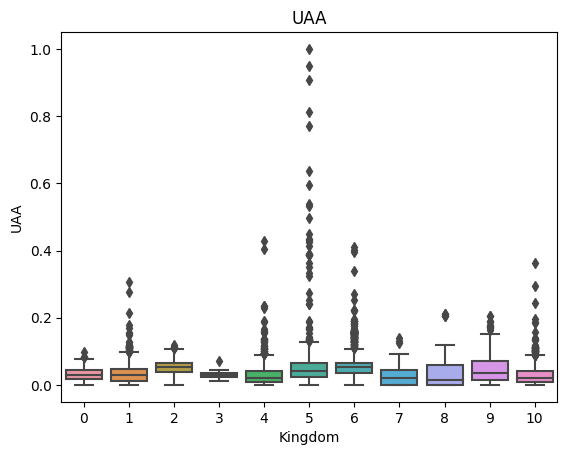

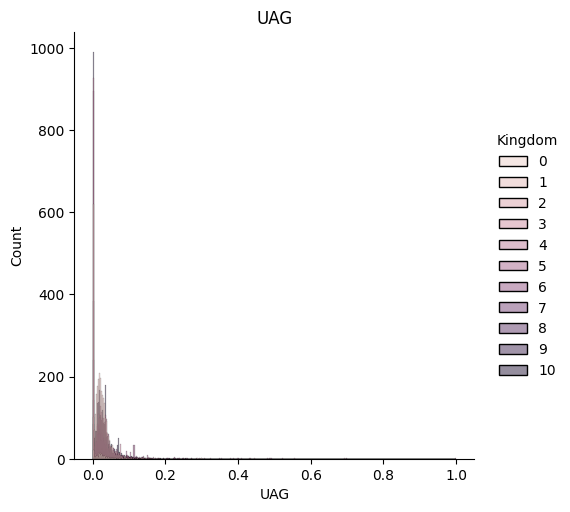

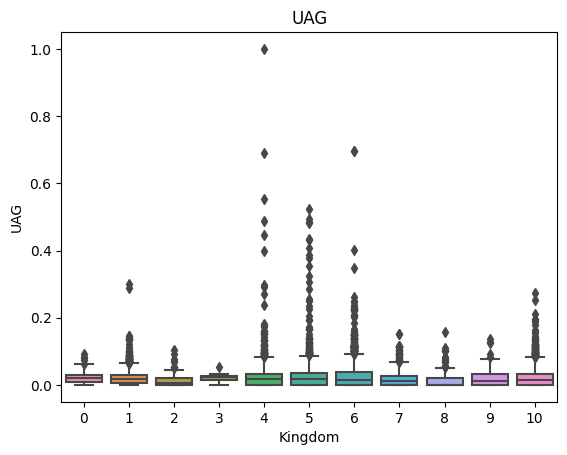

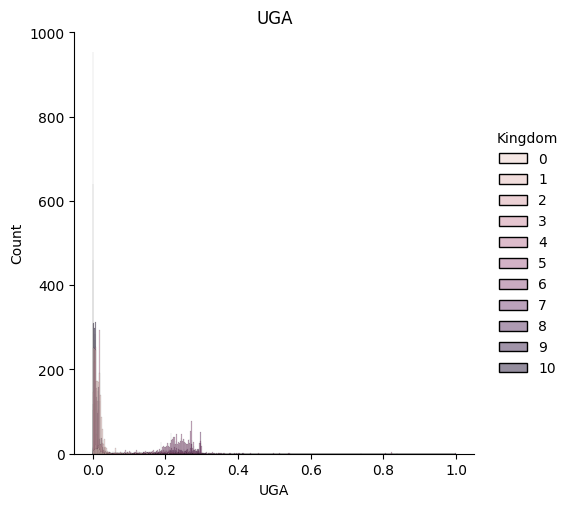

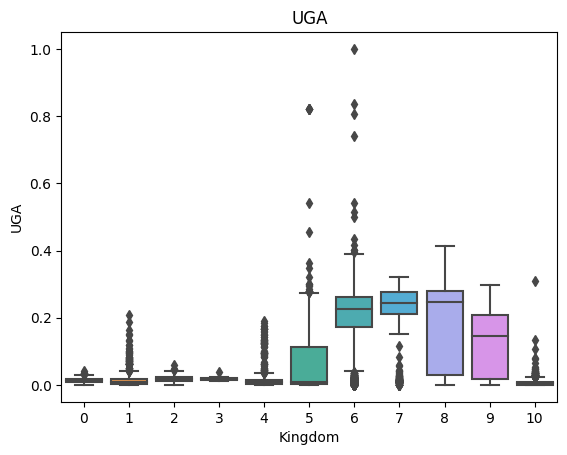

In [89]:
# Plotting all the features with respect to class - kingdom
for feature in features:
    hist_plot(feature, classes='Kingdom')
    boxplot_plot(feature, classes='Kingdom')

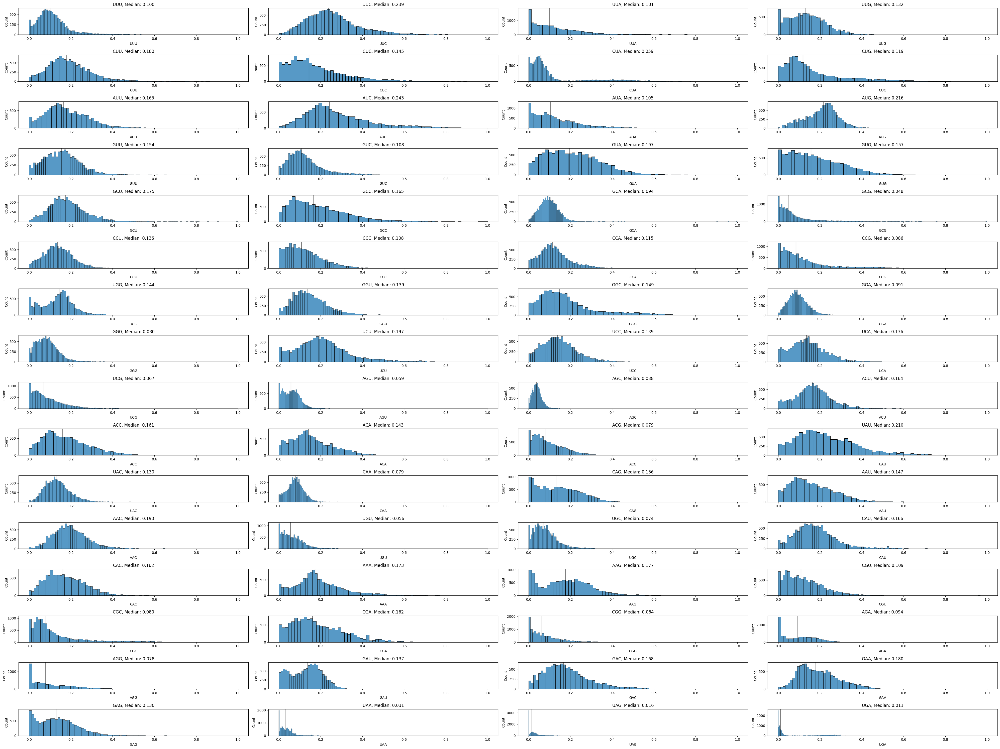

In [90]:
num_features = len(df2.columns) - 1  # Number of features excluding the first column

num_rows = 16
num_cols = 4

fig, axes = plt.subplots(num_rows, num_cols, figsize=(40, 30))

for i, ax in enumerate(axes.flatten()):
    if i < num_features:
        feature = df2.iloc[:, i + 1]  # Skip the first column as it might not be a feature
        sns.histplot(data=feature, ax=ax)
        median_val = feature.median()
        ax.set_title(f'{feature.name}, Median: {median_val:0.3f}')
        ax.axvline(median_val, color='black', alpha=0.5)
    else:
        ax.axis('off')  # Hide extra subplots beyond the number of features

plt.tight_layout()
plt.show()

### Multi Variate Analysis

#### Heatmap

<ipython-input-91-134a4e23745c>:2: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(df.corr(), annot=True, cmap = 'Purples',  fmt = '.2f', linewidths=.5)


<Axes: >

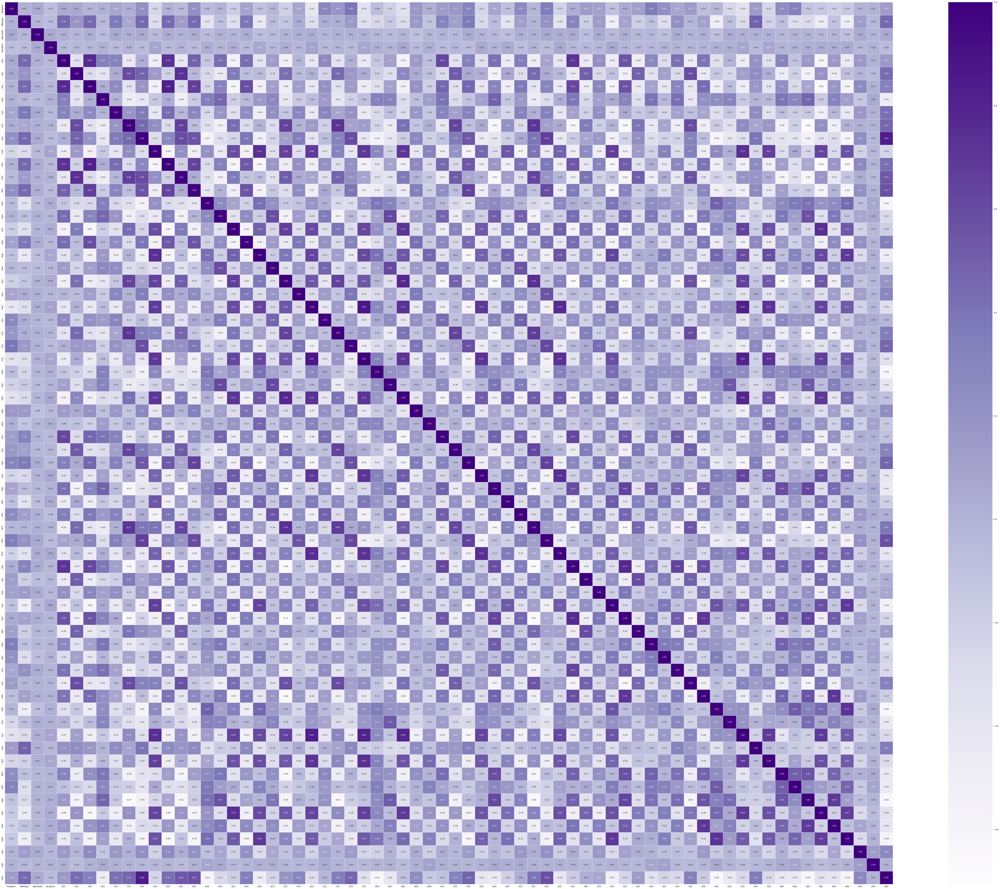

In [91]:
plt.figure(figsize=[100,80])
sns.heatmap(df.corr(), annot=True, cmap = 'Purples',  fmt = '.2f', linewidths=.5)

# Data Splitting and preprocessing

In [92]:
X = df.iloc[:, 1:]
X.drop(['SpeciesName', 'SpeciesID', 'DNAtype', 'Ncodons'], axis=1, inplace=True)
X_previous = X.copy()

In [93]:
X = X.values.astype(float)
y = df.iloc[:, 0]
y_original = y.values.astype(int)

In [95]:
class DataGenerator:

    def __init__(self, X, y, sampleSize=16):
        self.X = X
        self.y = y
        self.sampleSize = sampleSize
        if self.sampleSize <= 0 and self.sampleSize > len(self.X):
            return TypeError("sampleSize must be between 0 and ", len(X))

    def split_data(self, test_size=0.2, random_state=1):
        self.X_train, self.X_rem, self.y_train, self.y_remainder = tts(self.X, self.y, test_size=test_size, random_state=random_state)
        return self.X_train, self.X_rem, self.y_train, self.y_remainder


In [96]:
data_generator = DataGenerator(y=y, X=X)
X_training, X_testing, y_training, y_testing = data_generator.split_data()
X_training_original = X_training.copy()
y_training_original = y_training.copy()

### splitting into test and train

In [122]:
def sampler(X, y, method):
    if method =='ros':
        ros = RandomOverSampler(random_state=1)
        X_training, y_training = ros.fit_resample(X, y)

    elif method =='smote':
        smoothing = SMOTE(random_state=1)
        X_training, y_training = smoothing.fit_resample(X, y)

    elif method =='adasyn':
        adasyn = ADASYN(random_state=1)
        X_training, y_training = adasyn.fit_resample(X, y)

    return X_training, y_training

# MODEL BUILDING - Gausian Naive Bayes

In [124]:
class MultiClassClassification:
    def __init__(self, X_train, y_train, laplace_smoothing_value, laplace, total_classes=11, for_arc = False, for_plm = False):
        self.laplace_smoothing_value = laplace_smoothing_value
        self.laplace = laplace
        self.total_classes = total_classes
        self.X_train = X_train
        self.y_train = y_train
        self.for_arc = for_arc
        self.for_plm = for_plm
        self.fitFeatures = []
        self.list_of_ranges = []
        self.set_of_ranges = set([])

    def fit_distribution(self, data):
        return gaussian_kde(data)  # return the distribution

    def laplace_smoothing(self, classes, length):
        smooths = np.empty(self.total_classes, dtype=object)
        for i in range(length):
            smooths[i] = (classes[i] + self.laplace_smoothing_value) / \
                ((classes[i].size) +
                 self.laplace_smoothing_value * self.n_features)

        return smooths

    def probability(self, data):
        py = np.ones(self.total_classes)

        for i in range(self.n_features):
            for j in range(self.total_classes):
                py[j] *= self.features['X'+str(i)+'-'+str(j)].pdf(data[i])

        for i in range(self.total_classes):
            py[i] *= self.prior[i]

        # print('while training: ', py)
        return py

    def laplace_probability(self, data):

        py = np.ones(self.total_classes)
        pdf = np.ones(self.total_classes)

        for i in range(self.n_features):
            for j in range(self.total_classes):
                pdf[j] *= self.features['X'+str(i)+'-'+str(j)].pdf(data[i])

            smooths = self.laplace_smoothing(pdf, self.total_classes)
            for j in range(self.total_classes):
                py[j] *= smooths[j]

        for i in range(self.total_classes):
            py[i] *= self.prior[i]

        return py

    def fit(self):

        X_training_class = np.empty(self.total_classes, dtype=object)
        for i in range(self.total_classes):
            X_training_class[i] = self.X_train[self.y_train == i]

        self.prior = np.zeros(self.total_classes)
        for i in range(self.total_classes):
            # print('setting prior', i)
            if self.for_arc or self.for_plm:
                self.prior[i] = 1 - (len(X_training_class[i]) / len(self.X_train))
            else:
                self.prior[i] = len(X_training_class[i]) / len(self.X_train)
            self.prior[i] = len(X_training_class[i]) / len(self.X_train)

        self.n_features = self.X_train.shape[1]
        print('Number of features: ', self.n_features)
        self.features = {}

        for i in range(self.n_features):
            for j in range(self.total_classes):
                temp = 'X'+str(i)+'-'+str(j)
                self.features[temp] = self.fit_distribution(X_training_class[j][:, i])
                # print(str(i), str(j), temp)
                # self.list_of_ranges.append(temp)
                # if temp in self.set_of_ranges:
                #     print(str(i), str(j), 'Error: ', temp, ' already exists')
                # self.set_of_ranges.add(temp)


    def newvaluate(self):
        print(self.list_of_ranges)
        print(self.set_of_ranges)

    def predict(self, X_test, y_test):
        y_predicted = []

        y = []
        for sample, target in zip(X_test, y_test):

            if self.laplace:
                py = self.laplace_probability(sample)

            else:
                py = self.probability(sample)

            # print("Model predicted class {} and truth was {}".format(np.argmax(py), target))
            # print(py)
            # print(np.argmax(py))
            y_predicted.append(np.argmax(py))
            # print(py)
            y.append(target)

        y_predicted = np.array(y_predicted)
        y = np.array(y)
        return y_predicted, y


### Confusion Matrix and Validation

In [125]:
def draw_matrix(true_positive, false_positive, false_negative, true_negative):
    matrix = np.array([[true_positive, false_negative],
                      [false_positive, true_negative]])
    plt.imshow(matrix, interpolation='nearest', cmap=plt.cm.viridis_r)
    plt.colorbar()
    plt.show()


def confusion_matrix_calculator(y, y_predicted, desired_class):
    print('total y', y.size)
    print('total y_predicted', y_predicted.size)

    actual = (y == desired_class)
    predicted = (y_predicted == desired_class)
    print('actual', actual.sum())
    true_positive = (actual & predicted).sum()
    false_negative = (actual & ~predicted).sum()
    false_positive = (~actual & predicted).sum()
    true_negative = (~actual & ~predicted).sum()

    return true_positive, false_negative, false_positive, true_negative

In [126]:
def validation(given_y, y_predicted, classification_class='Kingdom', desired_classes = dict_class):
    for class_name in desired_classes.keys():
        print(class_name)
        print(df[df[classification_class] == int(
            desired_classes.get(class_name))][classification_class].count())
        true_positive, false_negative, false_positive, true_negative = confusion_matrix_calculator(y=given_y, y_predicted=y_predicted,
                                                                                                desired_class=int(desired_classes.get(class_name)))
        draw_matrix(true_positive= true_positive, true_negative= true_negative, false_positive= false_positive, false_negative= false_negative)
        print("true positive:", true_positive)
        print("false negative:", false_negative)
        print("false positive:", false_positive)
        print("true negative:", true_negative)
        print("Precision:", true_positive / (true_positive + false_positive))
        print("True Positive rate or Recall:",
              true_positive / (true_positive + false_negative))
        print("specificity, selectivity or True Negative Rate:",
              true_negative / (true_negative + false_positive))
        print("Accuracy:", (true_positive + true_negative) /
              (true_positive + false_positive + false_negative + true_negative))
        print("\n")


In [127]:
def validation(given_y, y_predicted, classification_class='Kingdom', desired_classes = dict_class):

    for class_name in desired_classes.keys():
        print(class_name)
        print(df[df[classification_class] == int(
            desired_classes.get(class_name))][classification_class].count())
        true_positive, false_negative, false_positive, true_negative = confusion_matrix_calculator(y=given_y, y_predicted=y_predicted,
                                                                                                desired_class=int(desired_classes.get(class_name)))
        draw_matrix(true_positive= true_positive, true_negative= true_negative, false_positive= false_positive, false_negative= false_negative)
        print("true positive:", true_positive)
        print("false negative:", false_negative)
        print("false positive:", false_positive)
        print("true negative:", true_negative)
        print("Precision:", true_positive / (true_positive + false_positive))
        print("True Positive rate or Recall:",
              true_positive / (true_positive + false_negative))
        print("specificity, selectivity or True Negative Rate:",
              true_negative / (true_negative + false_positive))
        print("Accuracy:", (true_positive + true_negative) /
              (true_positive + false_positive + false_negative + true_negative))
        print("\n")


In [128]:
def original_accuracy(y, y_predicted):
    actual = (y == y_predicted)
    return actual.sum() / len(y)

Using Sampling method:  smote
X_train shape:  (25687, 64)
y_train shape:  (25687,)
X_testing shape:  (2606, 64)
y_testing shape:  (2606,)




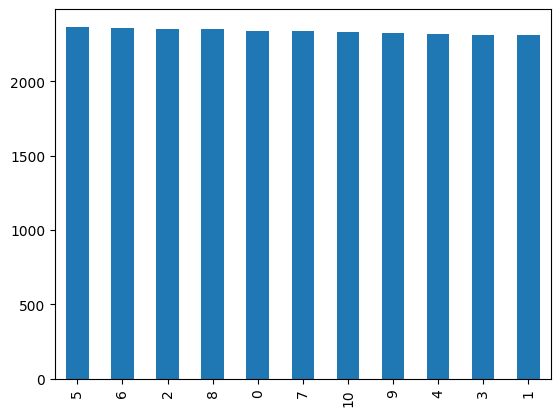



Number of features:  64
Model is trained
X_testing shape:  (2606, 64)
y_testing shape:  (2606,)
Y_predicted:  [10 10 10 ... 10  6  1]
y_predicted shape:  (2606,)
Y_test:  [ 5  5 10 ...  1  6  4]
y_test shape:  (2606,)
Original Accuracy:  0.6289332310053722
arc
126
total y 2606
total y_predicted 2606
actual 27


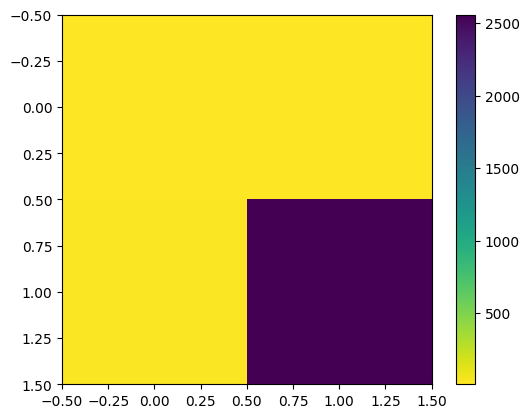

true positive: 18
false negative: 9
false positive: 21
true negative: 2558
Precision: 0.46153846153846156
True Positive rate or Recall: 0.6666666666666666
specificity, selectivity or True Negative Rate: 0.9918573090345095
Accuracy: 0.9884881043745203


bct
2919
total y 2606
total y_predicted 2606
actual 618


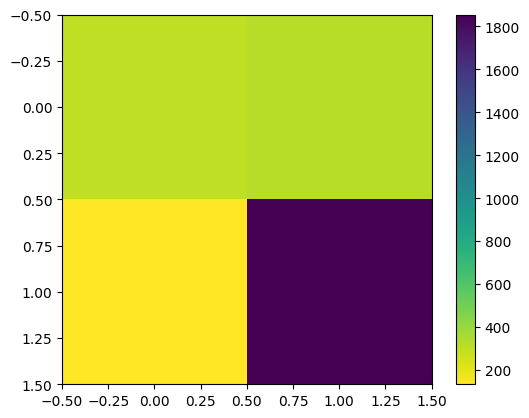

true positive: 301
false negative: 317
false positive: 134
true negative: 1854
Precision: 0.6919540229885057
True Positive rate or Recall: 0.48705501618122976
specificity, selectivity or True Negative Rate: 0.9325955734406438
Accuracy: 0.8269378357636225


phg
220
total y 2606
total y_predicted 2606
actual 37


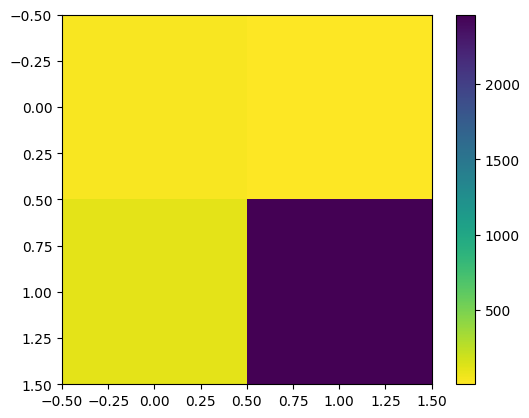

true positive: 29
false negative: 8
false positive: 108
true negative: 2461
Precision: 0.2116788321167883
True Positive rate or Recall: 0.7837837837837838
specificity, selectivity or True Negative Rate: 0.9579602958349552
Accuracy: 0.955487336914812


plm
18
total y 2606
total y_predicted 2606
actual 2


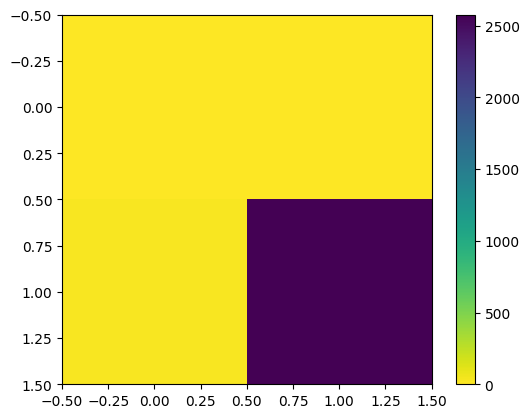

true positive: 2
false negative: 0
false positive: 28
true negative: 2576
Precision: 0.06666666666666667
True Positive rate or Recall: 1.0
specificity, selectivity or True Negative Rate: 0.989247311827957
Accuracy: 0.9892555640828856


pln
2523
total y 2606
total y_predicted 2606
actual 464


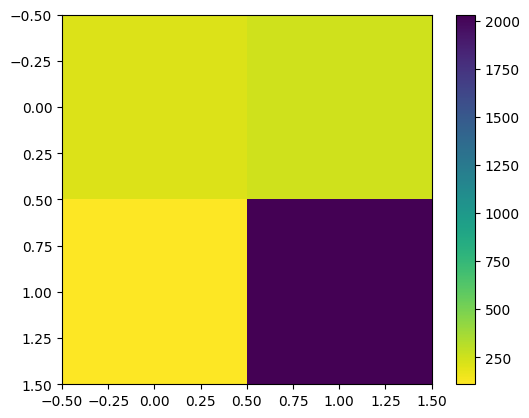

true positive: 213
false negative: 251
false positive: 109
true negative: 2033
Precision: 0.6614906832298136
True Positive rate or Recall: 0.45905172413793105
specificity, selectivity or True Negative Rate: 0.9491129785247432
Accuracy: 0.861857252494244


inv
1345
total y 2606
total y_predicted 2606
actual 298


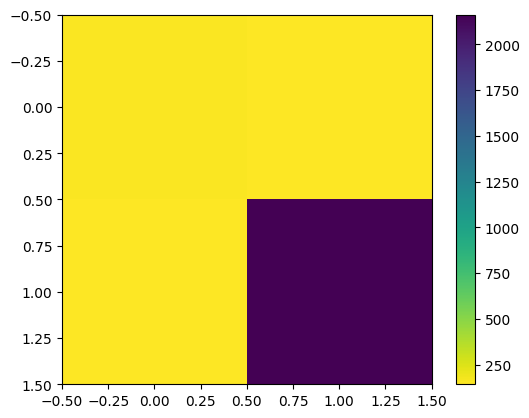

true positive: 156
false negative: 142
false positive: 146
true negative: 2162
Precision: 0.5165562913907285
True Positive rate or Recall: 0.5234899328859061
specificity, selectivity or True Negative Rate: 0.9367417677642981
Accuracy: 0.8894858019953953


vrt
2077
total y 2606
total y_predicted 2606
actual 390


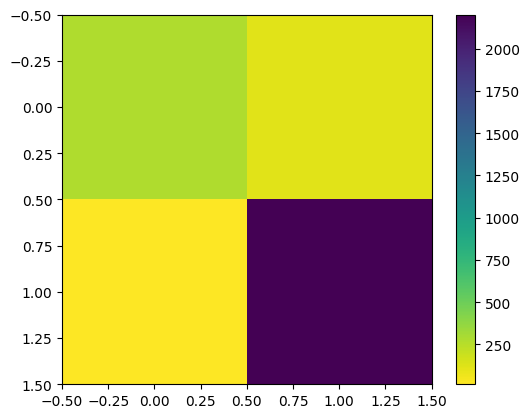

true positive: 276
false negative: 114
false positive: 14
true negative: 2202
Precision: 0.9517241379310345
True Positive rate or Recall: 0.7076923076923077
specificity, selectivity or True Negative Rate: 0.9936823104693141
Accuracy: 0.9508825786646201


mam
572
total y 2606
total y_predicted 2606
actual 96


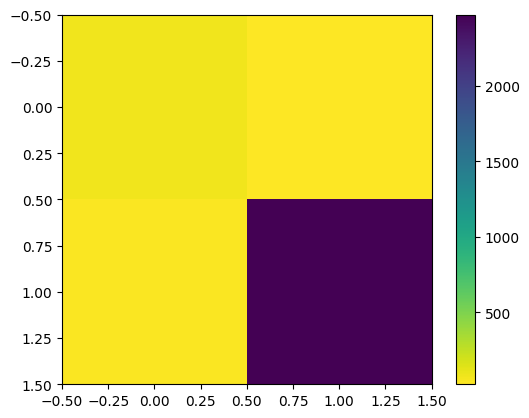

true positive: 73
false negative: 23
false positive: 38
true negative: 2472
Precision: 0.6576576576576577
True Positive rate or Recall: 0.7604166666666666
specificity, selectivity or True Negative Rate: 0.9848605577689243
Accuracy: 0.976592478894858


rod
215
total y 2606
total y_predicted 2606
actual 37


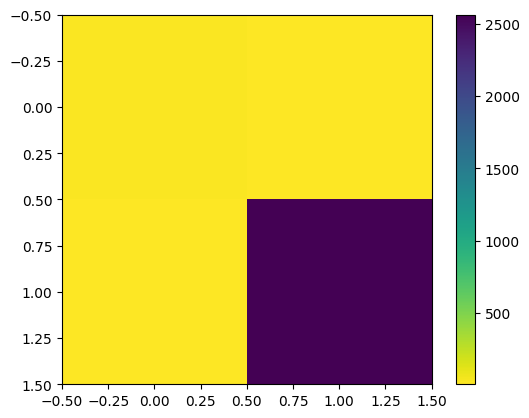

true positive: 24
false negative: 13
false positive: 5
true negative: 2564
Precision: 0.8275862068965517
True Positive rate or Recall: 0.6486486486486487
specificity, selectivity or True Negative Rate: 0.9980537173997664
Accuracy: 0.9930928626247122


pri
180
total y 2606
total y_predicted 2606
actual 38


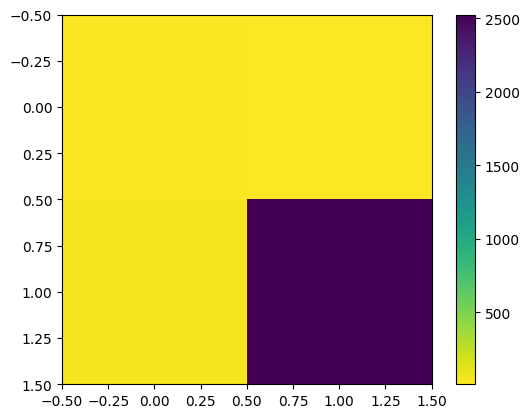

true positive: 28
false negative: 10
false positive: 44
true negative: 2524
Precision: 0.3888888888888889
True Positive rate or Recall: 0.7368421052631579
specificity, selectivity or True Negative Rate: 0.9828660436137072
Accuracy: 0.9792785878741366


vrl
2831
total y 2606
total y_predicted 2606
actual 599


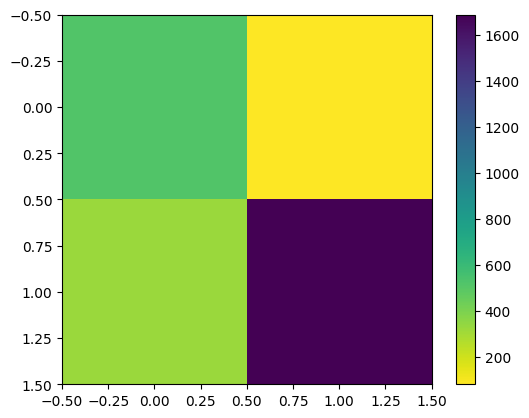

true positive: 519
false negative: 80
false positive: 320
true negative: 1687
Precision: 0.6185935637663885
True Positive rate or Recall: 0.8664440734557596
specificity, selectivity or True Negative Rate: 0.8405580468360737
Accuracy: 0.8465080583269379




In [129]:
methods =  ['smote']
for method in methods:
    # sampler(X, y, method)
    print('Using Sampling method: ', method)
    X_train_scaled, y_train_scaled = sampler(X, y ,method=method)
    data_generator = DataGenerator(y=y_train_scaled, X=X_train_scaled)
    X_train, X_test, y_train, y_test = data_generator.split_data()
    # X_train, y_train,
    # X_train, y_train = X_training, y_training
    print('X_train shape: ', X_train.shape)
    print('y_train shape: ', y_train.shape)
    print('X_testing shape: ', X_testing.shape)
    print('y_testing shape: ', y_testing.shape)

    print('\n')
    y_train.value_counts().plot(kind='bar')
    plt.show()
    print('\n')

    classify = MultiClassClassification(X_train=X_train, y_train=y_train, total_classes=11, laplace=False, laplace_smoothing_value=0.5,  for_arc=False, for_plm=False)
    classify.fit()
    print('Model is trained')
    # y_predicted, y
    y_predicted, given_y = classify.predict(X_test=X_testing, y_test=y_testing)
    print('X_testing shape: ', X_testing.shape)
    print('y_testing shape: ', y_testing.shape)

    print('Y_predicted: ', y_predicted)
    print('y_predicted shape: ', y_predicted.shape)
    print('Y_test: ', given_y)
    print('y_test shape: ', given_y.shape)
    print('Original Accuracy: ', original_accuracy(given_y, y_predicted))
    validation(given_y= given_y, y_predicted= y_predicted, desired_classes = dict_class)


In [130]:
print(X_training.shape)
print(X_train.shape)
print(X_test.shape)
print(X_testing.shape)

(10420, 64)
(25687, 64)
(6422, 64)
(2606, 64)


In [138]:
class PCA:
    def __init__(self, n):
        self.n = n
        self.components = None

    def fit(self, X):
        cov = np.cov(X, rowvar=False)
        eigen_values, eigen_vectors = np.linalg.eig(cov)

        eigen_pairs = [(np.abs(eigen_values[i]), eigen_vectors[:, i]) for i in range(len(eigen_values))]
        eigen_pairs.sort(key=lambda x: x[0], reverse=True)

        self.components = np.array([eigen_pair[1] for eigen_pair in eigen_pairs[:self.n]])

        explained_variance_ratio = eigen_values[:self.n].sum() / eigen_values.sum()
        print("Explained variance ratio:", explained_variance_ratio)

        plt.bar(range(X.shape[1]), eigen_values, width=0.5)
        plt.show()

    def transform(self, X):
        return np.dot(X, self.components.T)

Explained variance ratio: 0.9419941210538758


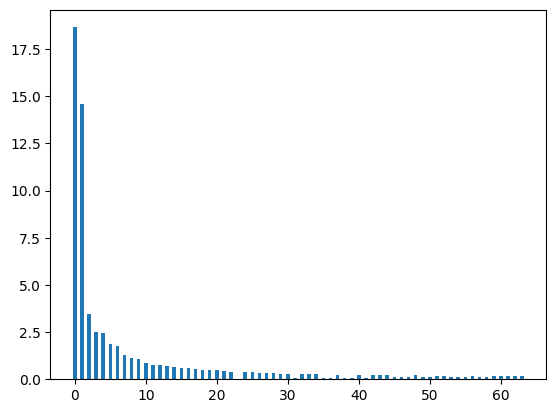

In [139]:
sc = StandardScaler()
X_scaled = sc.fit_transform(X_train)

model_PCA = PCA(n=40)
model_PCA.fit(X_scaled)
X_train_pca = model_PCA.transform(X_scaled)

In [140]:
X_train_pca[0]

array([ 2.83427464, -2.61476639, -1.46567398,  0.482592  ,  0.08294609,
       -0.0030809 , -1.44361505,  1.20796781, -1.18140592, -0.46646738,
        0.25945419,  0.46877361,  0.14151647, -0.98364154, -0.63671319,
        0.82402116,  0.72106006,  0.66932789, -0.140089  , -0.24896779,
        0.28269915, -0.43704621,  0.12150939, -0.04450029,  0.21858801,
       -0.00782277, -0.03668781, -0.28517952, -0.39994043,  0.28294889,
        0.15483011,  0.82962798, -0.05839691, -0.0881778 ,  0.32373259,
       -0.17129329, -0.31624335,  0.08458032, -0.14862832, -0.05523541])

X_train shape:  (25687, 40)
y_train shape:  (25687,)
X_testing shape:  (2606, 64)
y_testing shape:  (2606,)




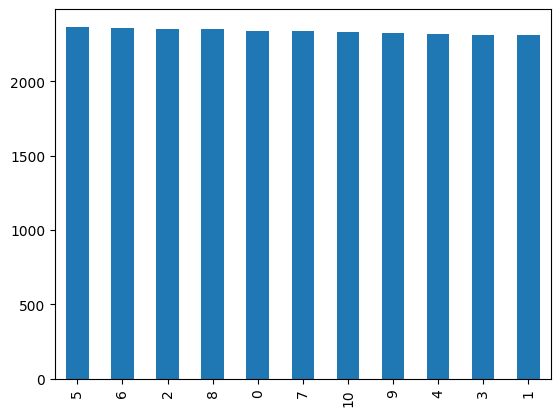



Number of features:  40
Model is trained
X_testing shape:  (2606, 64)
y_testing shape:  (2606,)
Y_predicted:  [7 7 7 ... 7 7 7]
y_predicted shape:  (2606,)
Y_test:  [ 5  5 10 ...  1  6  4]
y_test shape:  (2606,)
Original Accuracy:  0.03683806600153492
arc
126
total y 2606
total y_predicted 2606
actual 27


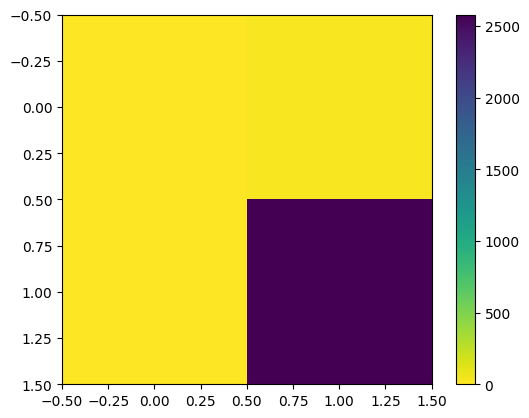

true positive: 0
false negative: 27
false positive: 0
true negative: 2579
Precision: nan
True Positive rate or Recall: 0.0
specificity, selectivity or True Negative Rate: 1.0
Accuracy: 0.9896392939370683


bct
2919
total y 2606
total y_predicted 2606
actual 618


<ipython-input-127-ad753f6c0797>:14: RuntimeWarning: invalid value encountered in long_scalars
  print("Precision:", true_positive / (true_positive + false_positive))


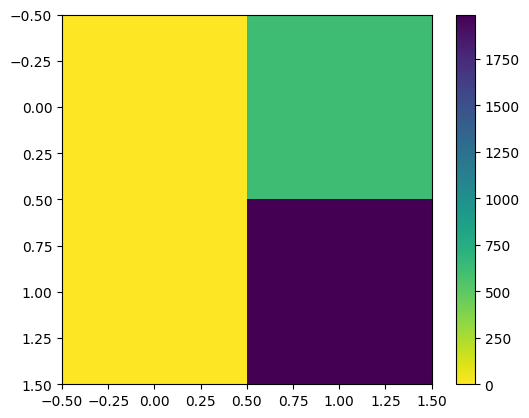

true positive: 0
false negative: 618
false positive: 0
true negative: 1988
Precision: nan
True Positive rate or Recall: 0.0
specificity, selectivity or True Negative Rate: 1.0
Accuracy: 0.762854950115119


phg
220
total y 2606
total y_predicted 2606
actual 37


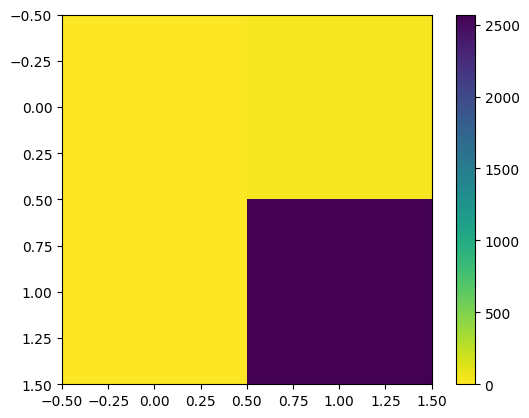

true positive: 0
false negative: 37
false positive: 0
true negative: 2569
Precision: nan
True Positive rate or Recall: 0.0
specificity, selectivity or True Negative Rate: 1.0
Accuracy: 0.9858019953952417


plm
18
total y 2606
total y_predicted 2606
actual 2


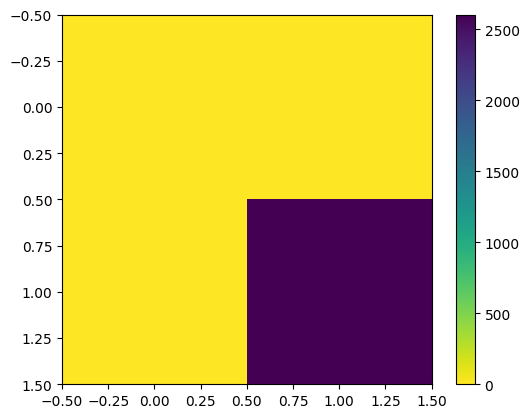

true positive: 0
false negative: 2
false positive: 0
true negative: 2604
Precision: nan
True Positive rate or Recall: 0.0
specificity, selectivity or True Negative Rate: 1.0
Accuracy: 0.9992325402916347


pln
2523
total y 2606
total y_predicted 2606
actual 464


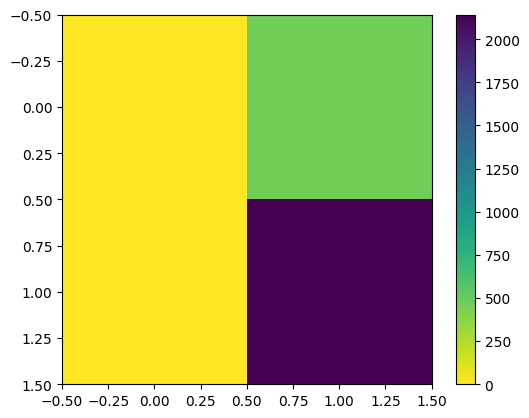

true positive: 0
false negative: 464
false positive: 0
true negative: 2142
Precision: nan
True Positive rate or Recall: 0.0
specificity, selectivity or True Negative Rate: 1.0
Accuracy: 0.8219493476592479


inv
1345
total y 2606
total y_predicted 2606
actual 298


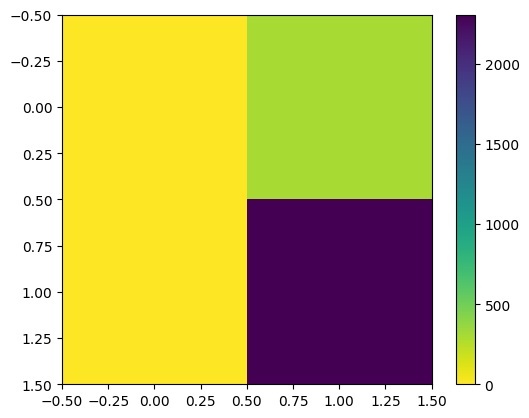

true positive: 0
false negative: 298
false positive: 0
true negative: 2308
Precision: nan
True Positive rate or Recall: 0.0
specificity, selectivity or True Negative Rate: 1.0
Accuracy: 0.8856485034535687


vrt
2077
total y 2606
total y_predicted 2606
actual 390


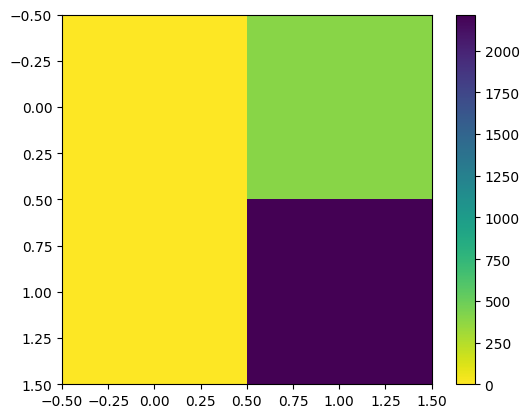

true positive: 0
false negative: 390
false positive: 0
true negative: 2216
Precision: nan
True Positive rate or Recall: 0.0
specificity, selectivity or True Negative Rate: 1.0
Accuracy: 0.8503453568687643


mam
572
total y 2606
total y_predicted 2606
actual 96


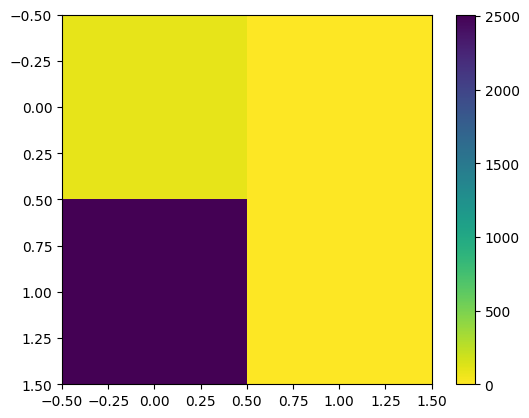

true positive: 96
false negative: 0
false positive: 2510
true negative: 0
Precision: 0.03683806600153492
True Positive rate or Recall: 1.0
specificity, selectivity or True Negative Rate: 0.0
Accuracy: 0.03683806600153492


rod
215
total y 2606
total y_predicted 2606
actual 37


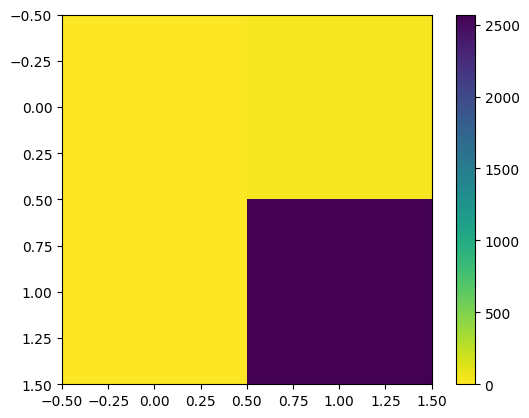

true positive: 0
false negative: 37
false positive: 0
true negative: 2569
Precision: nan
True Positive rate or Recall: 0.0
specificity, selectivity or True Negative Rate: 1.0
Accuracy: 0.9858019953952417


pri
180
total y 2606
total y_predicted 2606
actual 38


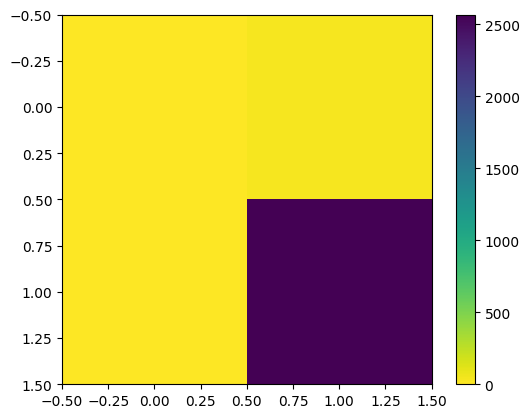

true positive: 0
false negative: 38
false positive: 0
true negative: 2568
Precision: nan
True Positive rate or Recall: 0.0
specificity, selectivity or True Negative Rate: 1.0
Accuracy: 0.985418265541059


vrl
2831
total y 2606
total y_predicted 2606
actual 599


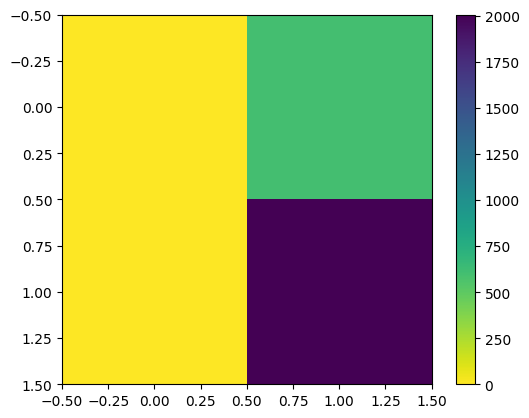

true positive: 0
false negative: 599
false positive: 0
true negative: 2007
Precision: nan
True Positive rate or Recall: 0.0
specificity, selectivity or True Negative Rate: 1.0
Accuracy: 0.7701458173445894




In [141]:

methods = ['smooth']

for method in methods:

    print('X_train shape: ', X_train_pca.shape)
    print('y_train shape: ', y_train.shape)
    print('X_testing shape: ', X_testing.shape)
    print('y_testing shape: ', y_testing.shape)

    print('\n')
    y_train.value_counts().plot(kind='bar')
    plt.show()
    print('\n')

    clf = MultiClassClassification(X_train=X_train_pca, y_train=y_train, total_classes=11, laplace=False, laplace_smoothing_value=0.5,  for_arc=False, for_plm=False)
    clf.fit()
    print('Model is trained')

    y_predicted, given_y = clf.predict(X_test=X_testing, y_test=y_testing)
    print('X_testing shape: ', X_testing.shape)
    print('y_testing shape: ', y_testing.shape)

    print('Y_predicted: ', y_predicted)
    print('y_predicted shape: ', y_predicted.shape)
    print('Y_test: ', given_y)
    print('y_test shape: ', given_y.shape)
    print('Original Accuracy: ', original_accuracy(given_y, y_predicted))
    validation(given_y= given_y, y_predicted= y_predicted, desired_classes = dict_class)

# MODEL BUILDING - Logistic Regression

In [ ]:
df = df.copy()

In [ ]:
X = df.iloc[:,5:]
y = df.iloc[:,0]

In [ ]:
X_train, X_test, y_train, y_test = tts(X, y, test_size=0.3, random_state=42)

In [147]:
class SoftmaxRegression:
    def __init__(self, max_iterations, learning_rate, tolerance, regularization_parameter, regularization=False, sdg=False):
        self.theta = None
        self.class_names = None

        self.max_iterations = max_iterations
        self.learning_rate = learning_rate
        self.tolerance = tolerance
        self.sdg = sdg
        self.regularization = regularization
        self.regularization_parameter = regularization_parameter

    def softmax(self, z):
        expo = np.exp(z)
        return expo / np.sum(expo, axis=0)

    def _one_hot_encoding(self, y):
        self.class_names = list(set(y))
        n = len(self.class_names)
        class_dict = dict(zip(self.class_names, range(n)))
        y = list(map(lambda x: class_dict[x], y))
        m = len(y)
        y_one_hot = np.zeros((m, n))
        y_one_hot[range(m), y] = 1
        return y_one_hot

    def predict_prob(self, x):
        return self.softmax(self.theta @ x.T)

    def predict(self, x):
        return np.argmax(self.predict_prob(x), axis=0)

    def predict_class(self, x):
        return list(map(lambda i: self.class_names[i], self.predict(x)))

    def fit(self, X, y):
        theta = np.zeros((len(set(y)), X.shape[1]))
        cost_history = np.zeros(self.max_iterations)
        y = self._one_hot_encoding(y)
        last_err = float('inf')
        X_ = X.copy()
        y_ = y.copy()

        for i in tqdm(range(self.max_iterations)):
            if self.sdg:
                index = np.random.randint(low=0, high=len(X_), size=int(len(X_) * 0.25))
                X = X_[index]
                y = y_[index]

            h = self.softmax(theta @ X.T).T
            gradients = (h - y).T @ X

            if self.regularization:
                r = (self.regularization_parameter / X.shape[0])
                w_in = theta * (1 - self.learning_rate * r)
                theta = w_in - (self.learning_rate * gradients)
                c = -np.sum(y * np.log(self.softmax(theta @ X.T).T))
                cost_history[i] = c + (self.regularization_parameter * np.sum(np.square(theta)))
            else:
                theta = theta - self.learning_rate * gradients
                cost_history[i] = -np.sum(y * np.log(self.softmax(theta @ X.T).T))

            if abs(cost_history[i] - last_err) < self.tolerance:
                print('Model stopped learning')
                break
            last_err = cost_history[i]

        self.theta = theta
        print()
        print(self.theta)
        return cost_history


In [148]:
scaler = StandardScaler()
X_train_ = scaler.fit_transform(X_train) #standardization
X_test_ = scaler.transform(X_test)

X_train_ = np.append(np.ones((X_train.shape[0], 1)), X_train_, axis=1)  # add bias
X_test_ = np.append(np.ones((X_test.shape[0], 1)), X_test_, axis=1)

### LR without Regularization and without SGD

In [149]:
softmax_model = SoftmaxRegression(max_iterations=1400, learning_rate=0.0001, tolerance=1e-3, regularization_parameter=0.003)# without regularization and no sdg
history = softmax_model.fit(X_train_, y_train)

100%|██████████| 1400/1400 [01:05<00:00, 21.54it/s]


[[-1.08581018e+00 -1.72724313e+00 -4.46827486e-01  2.38684138e-01
   1.12027536e-01  7.91556918e-01  5.94191221e-01 -1.42132076e-01
  -1.16310470e+00  1.14222258e+00  3.08591118e-01  7.09836466e-01
  -5.52520504e-01  1.29655748e+00  1.96347807e+00  1.21572412e+00
  -2.25207300e-01 -3.51803760e-01 -3.06903575e-01  9.30386550e-01
   2.75437697e-01 -7.13514001e-01 -1.50128590e-01 -6.19268238e-02
   9.26099601e-01 -3.11414041e-01 -1.35277437e-01  5.16088594e-01
  -1.18158918e-01 -2.88225966e-01 -1.11490923e+00 -4.46265515e-01
   3.59649942e-02  2.34422625e-01  2.30491350e-01 -1.38101429e-01
   4.89976406e-01  2.31777302e-01 -1.41369155e+00  7.30693808e-01
   1.59638328e+00  8.58681021e-01 -9.58584822e-02 -1.85417780e-01
  -5.25310430e-01 -5.97621585e-02 -3.16634826e-01 -1.21326018e+00
  -4.45850842e-01 -9.52161260e-01 -5.31622926e-01 -1.70034393e+00
  -9.52703312e-01 -1.13965416e+00 -8.79305996e-01  4.52822283e-01
   2.17999751e-01  1.82806434e+00  5.84047249e-01  5.27046212e-01
   5.8441

Text(0, 0.5, 'Cost')

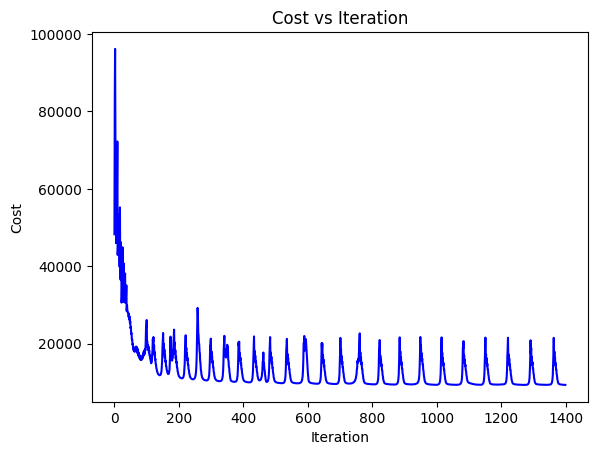

In [146]:
fig, ax = plt.subplots()
ax.plot(range(len(history)), history, 'b')
ax.set_title('Cost vs Iteration')
ax.set_xlabel('Iteration')
ax.set_ylabel('Cost')

In [150]:
print('Training_Accuracy: {}'.format((y_train == softmax_model.predict_class(X_train_)).sum()/len(y_train)))

Training_Accuracy: 0.8906450733834235


In [151]:
print('testing accuracy: {}'.format((y_test == softmax_model.predict_class(X_test_)).sum()/len(y_test)))

testing accuracy: 0.8796325132357521


In [152]:
y_pred = softmax_model.predict_class(X_test_)
confusion_matrix(y_test,y_pred)

array([[579,   2,   1,   0,   0,   1,   0,   0,   0,   0,   0],
       [ 20, 487,  47,  26,  21,   6,   0,   0,   0,   2,   2],
       [  2,  33, 527,   3,   3,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0, 606,   0,   0,   0,   0,   0,   0,   0],
       [  2,  17,   7,   2, 490,  46,   5,   0,   0,   2,  31],
       [  2,   9,   4,   0,  60, 430,  12,   2,   1,   4,  28],
       [  1,   0,   0,   1,   0,  24, 486,  11,  21,  15,   4],
       [  0,   0,   0,   0,   0,   0,   9, 483,  61,  29,   2],
       [  0,   2,   0,   0,   0,   1,  18,  44, 486,  17,   2],
       [  0,   0,   0,   0,   0,   0,   7,  16,  21, 548,   3],
       [  2,   2,   1,   0,  20,  27,   2,   3,   2,   2, 527]])

In [153]:
print(classification_report(y_true=y_test, y_pred=y_pred))

              precision    recall  f1-score   support

           0       0.95      0.99      0.97       583
           1       0.88      0.80      0.84       611
           2       0.90      0.93      0.91       568
           3       0.95      1.00      0.97       606
           4       0.82      0.81      0.82       602
           5       0.80      0.78      0.79       552
           6       0.90      0.86      0.88       563
           7       0.86      0.83      0.85       584
           8       0.82      0.85      0.84       570
           9       0.89      0.92      0.90       595
          10       0.88      0.90      0.89       588

    accuracy                           0.88      6422
   macro avg       0.88      0.88      0.88      6422
weighted avg       0.88      0.88      0.88      6422



In [154]:
for i in range(len(list(set(y_test)))):
  print(multilabel_confusion_matrix(y_true=y_test, y_pred=y_pred, labels=list(set(y_test)))[i], list(set(y))[i])

[[5810   29]
 [   4  579]] 0
[[5746   65]
 [ 124  487]] 1
[[5794   60]
 [  41  527]] 2
[[5784   32]
 [   0  606]] 3
[[5716  104]
 [ 112  490]] 4
[[5765  105]
 [ 122  430]] 5
[[5806   53]
 [  77  486]] 6
[[5762   76]
 [ 101  483]] 7
[[5746  106]
 [  84  486]] 8
[[5756   71]
 [  47  548]] 9
[[5762   72]
 [  61  527]] 10


### With Regularization and SGD

In [155]:
softmax_model_reg = SoftmaxRegression(max_iterations=5000, learning_rate=0.0001, tolerance=1e-5, regularization_parameter=0.04, regularization=True, sdg=True)# setting regularization to true
history = softmax_model_reg.fit(X_train_, y_train)

100%|██████████| 5000/5000 [01:14<00:00, 67.48it/s]


[[-1.16719306 -1.66446068 -0.40680419  0.17825085  0.05408018  0.79344071
   0.49908995 -0.09226905 -0.90399411  1.06955675  0.2918564   0.72470313
  -0.53379952  1.22284003  1.82930762  1.10907162 -0.23186135 -0.37100476
  -0.37919153  0.87892903  0.29930934 -0.64189762 -0.16194615 -0.06902114
   0.82622263 -0.29865413 -0.12263844  0.47764249 -0.12782496 -0.24273609
  -1.06677063 -0.40272884  0.01903262  0.16617218  0.21091283 -0.18284361
   0.43416142  0.21439624 -1.29792061  0.7179014   1.54266171  0.77098887
  -0.11995329 -0.20568531 -0.55341866 -0.08460882 -0.31410957 -1.15754855
  -0.48434236 -0.86444428 -0.43406909 -1.52161791 -0.89033566 -0.95260784
  -0.83116313  0.42462327  0.16195165  1.71192934  0.51051616  0.47908402
   0.54036789  0.70244975  0.56457929  0.01378676 -1.35153445]
 [ 1.22844176  0.3683869  -1.09132398  0.26502688  0.37038446  0.13535547
   1.02848017 -1.1084321   0.36429334 -0.23730345  1.01436976 -0.61026218
  -0.52296485  0.41791152 -0.32169443  0.7852346

Text(0, 0.5, 'Cost')

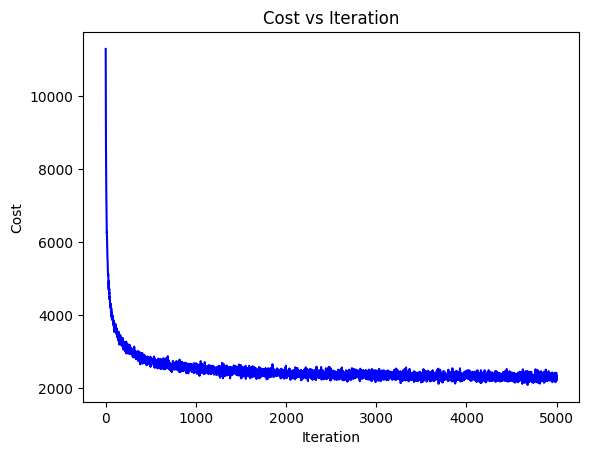

In [156]:
fig, ax = plt.subplots()
ax.plot(range(len(history)), history, 'b')
ax.set_title('Cost vs Iteration')
ax.set_xlabel('Iteration')
ax.set_ylabel('Cost')

In [157]:
print('Training_accuracy: {}'.format((y_train == softmax_model_reg.predict_class(X_train_)).sum()/len(y_train)))
print('Testing_accuracy: {}'.format((y_test == softmax_model_reg.predict_class(X_test_)).sum()/len(y_test)))

Training_accuracy: 0.8927862342819325
Testing_accuracy: 0.879009654313298


In [158]:
print(classification_report(y_true=y_test, y_pred=softmax_model_reg.predict_class(X_test_)))

              precision    recall  f1-score   support

           0       0.95      1.00      0.97       583
           1       0.88      0.80      0.84       611
           2       0.90      0.93      0.92       568
           3       0.94      1.00      0.97       606
           4       0.84      0.80      0.82       602
           5       0.80      0.78      0.79       552
           6       0.91      0.86      0.88       563
           7       0.86      0.83      0.84       584
           8       0.82      0.86      0.84       570
           9       0.87      0.91      0.89       595
          10       0.88      0.90      0.89       588

    accuracy                           0.88      6422
   macro avg       0.88      0.88      0.88      6422
weighted avg       0.88      0.88      0.88      6422



In [163]:
methods = ['smote']


for method in methods:
    # sampler(X, y, method)
    print('Using Sampling method: ', method)
    X_train_scaled, y_train_scaled = sampler(X, y ,method=method)
    data_generator = DataGenerator(y=y_train_scaled, X=X_train_scaled)
    X_train, X_test, y_train, y_test = data_generator.split_data()
    # X_train, y_train,
    # X_train, y_train = X_training, y_training
    print('X_train shape: ', X_train.shape)
    print('y_train shape: ', y_train.shape)
    print('X_testing shape: ', X_testing.shape)
    print('y_testing shape: ', y_testing.shape)





Using Sampling method:  smote
X_train shape:  (25687, 64)
y_train shape:  (25687,)
X_testing shape:  (2606, 64)
y_testing shape:  (2606,)


In [164]:
scaler = StandardScaler()
X_train_ = scaler.fit_transform(X_train) #standardization
X_test_ = scaler.transform(X_testing)

X_train_ = np.append(np.ones((X_train.shape[0], 1)), X_train_, axis=1)  # add bias
X_test_ = np.append(np.ones((X_testing.shape[0], 1)), X_test_, axis=1)

In [165]:
softmax_model = SoftmaxRegression(max_iterations=1400, learning_rate=0.0001, tolerance=1e-3, regularization_parameter=0.004)# without regularization and no sdg
history = softmax_model.fit(X_train_, y_train)

100%|██████████| 1400/1400 [01:06<00:00, 21.01it/s]



[[-1.08581018e+00 -1.72724313e+00 -4.46827486e-01  2.38684138e-01
   1.12027536e-01  7.91556918e-01  5.94191221e-01 -1.42132076e-01
  -1.16310470e+00  1.14222258e+00  3.08591118e-01  7.09836466e-01
  -5.52520504e-01  1.29655748e+00  1.96347807e+00  1.21572412e+00
  -2.25207300e-01 -3.51803760e-01 -3.06903575e-01  9.30386550e-01
   2.75437697e-01 -7.13514001e-01 -1.50128590e-01 -6.19268238e-02
   9.26099601e-01 -3.11414041e-01 -1.35277437e-01  5.16088594e-01
  -1.18158918e-01 -2.88225966e-01 -1.11490923e+00 -4.46265515e-01
   3.59649942e-02  2.34422625e-01  2.30491350e-01 -1.38101429e-01
   4.89976406e-01  2.31777302e-01 -1.41369155e+00  7.30693808e-01
   1.59638328e+00  8.58681021e-01 -9.58584822e-02 -1.85417780e-01
  -5.25310430e-01 -5.97621585e-02 -3.16634826e-01 -1.21326018e+00
  -4.45850842e-01 -9.52161260e-01 -5.31622926e-01 -1.70034393e+00
  -9.52703312e-01 -1.13965416e+00 -8.79305996e-01  4.52822283e-01
   2.17999751e-01  1.82806434e+00  5.84047249e-01  5.27046212e-01
   5.8441

Text(0, 0.5, 'Cost')

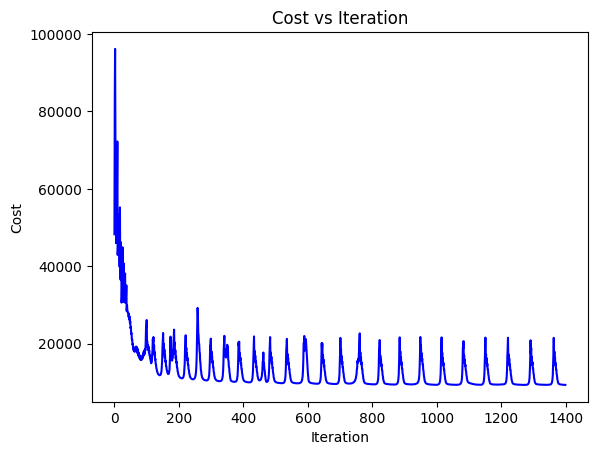

In [166]:
fig, ax = plt.subplots()
ax.plot(range(len(history)), history, 'b')
ax.set_title('Cost vs Iteration')
ax.set_xlabel('Iteration')
ax.set_ylabel('Cost')

In [167]:
print('Training_accuracy: {}'.format((y_train == softmax_model.predict_class(X_train_)).sum()/len(y_train)))

Training_accuracy: 0.8906450733834235


In [168]:
print('Testing_accuracy: {}'.format((y_testing == softmax_model.predict_class(X_test_)).sum()/len(y_testing)))

Testing_accuracy: 0.8250191864927091


In [169]:
from sklearn.metrics import confusion_matrix,classification_report, multilabel_confusion_matrix


In [170]:
y_pred = softmax_model.predict_class(X_test_)

In [171]:
confusion_matrix(y_testing,y_pred)

array([[ 25,   1,   1,   0,   0,   0,   0,   0,   0,   0,   0],
       [ 18, 497,  40,  26,  17,  12,   2,   0,   0,   1,   5],
       [  2,   4,  31,   0,   0,   0,   0,   0,   0,   0,   0],
       [  0,   0,   0,   2,   0,   0,   0,   0,   0,   0,   0],
       [  1,  16,   6,   2, 373,  35,   1,   1,   1,   2,  26],
       [  2,   9,   3,   1,  22, 229,   2,   3,   2,   2,  23],
       [  0,   0,   0,   1,   0,  16, 334,  10,  17,  10,   2],
       [  0,   0,   0,   0,   0,   0,   2,  66,  14,  13,   1],
       [  0,   0,   0,   0,   0,   1,   1,   2,  31,   2,   0],
       [  0,   0,   0,   0,   0,   0,   1,   1,   3,  33,   0],
       [  0,   4,   1,   1,  30,  22,   4,   4,   3,   1, 529]])

In [172]:
print(classification_report(y_true=y_testing, y_pred=softmax_model_reg.predict_class(X_test_)))

              precision    recall  f1-score   support

           0       0.59      0.96      0.73        27
           1       0.94      0.83      0.88       618
           2       0.41      0.84      0.55        37
           3       0.05      1.00      0.10         2
           4       0.86      0.80      0.83       464
           5       0.74      0.78      0.76       298
           6       0.97      0.86      0.91       390
           7       0.81      0.70      0.75        96
           8       0.46      0.86      0.60        37
           9       0.51      0.87      0.64        38
          10       0.90      0.89      0.90       599

    accuracy                           0.83      2606
   macro avg       0.66      0.85      0.70      2606
weighted avg       0.87      0.83      0.85      2606



In [173]:
softmax_model_reg = SoftmaxRegression(max_iterations=5000, learning_rate=0.0001, tolerance=1e-5, regularization_parameter=0.04, regularization=True, sdg=True)
history = softmax_model_reg.fit(X_train_, y_train)

100%|██████████| 5000/5000 [01:12<00:00, 68.78it/s]


[[-1.16048003e+00 -1.66073366e+00 -4.15287441e-01  1.83138064e-01
   6.33263895e-02  8.00331228e-01  4.83697386e-01 -9.00514900e-02
  -8.99329511e-01  1.07415358e+00  2.77049235e-01  7.38765594e-01
  -5.34894019e-01  1.21426270e+00  1.81563298e+00  1.10862248e+00
  -2.28017702e-01 -3.64726389e-01 -3.73973979e-01  8.55261379e-01
   2.99945840e-01 -6.28585917e-01 -1.62775531e-01 -7.44152238e-02
   8.35092954e-01 -3.06577869e-01 -1.24513561e-01  4.83403702e-01
  -1.30898428e-01 -2.36471655e-01 -1.07278843e+00 -3.90978053e-01
   2.45168771e-02  1.76914037e-01  2.02741252e-01 -1.78806521e-01
   4.54585201e-01  2.25983493e-01 -1.30351343e+00  7.01928213e-01
   1.55899415e+00  7.63185328e-01 -1.24024731e-01 -2.00784986e-01
  -5.58903647e-01 -8.10083061e-02 -3.12452288e-01 -1.15709955e+00
  -4.73181817e-01 -8.69556227e-01 -4.41772402e-01 -1.53235019e+00
  -8.88007579e-01 -9.54626642e-01 -8.20078532e-01  4.25592786e-01
   1.65684899e-01  1.70278110e+00  5.15509546e-01  4.70811808e-01
   5.2904

Text(0, 0.5, 'Cost')

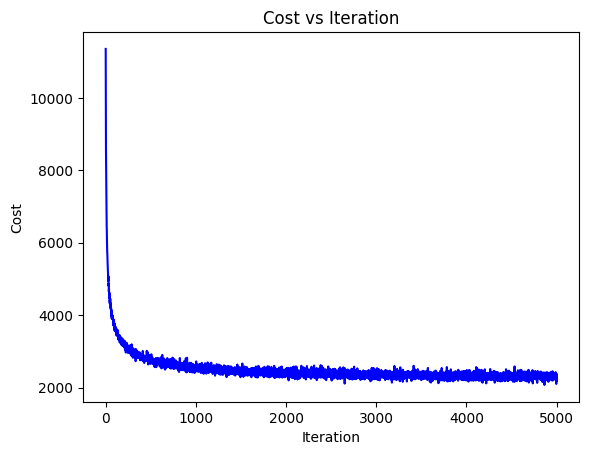

In [174]:
fig, ax = plt.subplots()
ax.plot(range(len(history)), history, 'b')
ax.set_title('Cost vs Iteration')
ax.set_xlabel('Iteration')
ax.set_ylabel('Cost')

In [175]:

print('training accuracy: {}'.format((y_train == softmax_model_reg.predict_class(X_train_)).sum()/len(y_train)))
print('testing accuracy: {}'.format((y_testing == softmax_model_reg.predict_class(X_test_)).sum()/len(y_testing)))

print(classification_report(y_true=y_testing, y_pred=softmax_model_reg.predict_class(X_test_)))

training accuracy: 0.8930587456690154
testing accuracy: 0.8330775134305449
              precision    recall  f1-score   support

           0       0.57      0.96      0.71        27
           1       0.94      0.82      0.88       618
           2       0.40      0.84      0.54        37
           3       0.05      1.00      0.10         2
           4       0.85      0.80      0.82       464
           5       0.75      0.78      0.76       298
           6       0.96      0.86      0.91       390
           7       0.80      0.71      0.75        96
           8       0.46      0.86      0.60        37
           9       0.50      0.87      0.63        38
          10       0.90      0.89      0.90       599

    accuracy                           0.83      2606
   macro avg       0.65      0.85      0.69      2606
weighted avg       0.87      0.83      0.84      2606



# MODEL BUILDING - KNN

In [176]:
from sklearn.metrics import classification_report
from datetime import datetime
class KNearestNeighbor:

    def __init__(self,X_train,y_train):
        self.X_train = X_train
        self.y_train = y_train
        # self.X_test = X_test
        # self.y_test = y_test


    def euclidean_dist(self,pointA, pointB):
        distance = np.square(pointA - pointB) # (ai-bi)**2 for every point in the vectors
        distance = np.sum(distance) # adds all values
        distance = np.sqrt(distance)
        return distance

    def distance_from_all_training(self,test_point):
        dist_array = np.array([])
        for train_point in self.X_train:
            dist = self.euclidean_dist(test_point, train_point)
            # print(dist)
            if dist > 0:
                dist_array = np.append(dist_array, dist)

            else:
                dist_array = np.append(dist_array, 124444)
        # print(dist_array)
        return dist_array

    def distance_from_all_training2(self,k=5):
        dist_array = np.array([])
        for train_point in self.X_train:
            for test_point in self.X_test:
                dist = self.euclidean_dist(test_point, train_point)
            dist_array = np.append(dist_array, dist)
        print(dist_array.shape)
        print(dist_array.shape)
        return dist_array

    def accuracy_train(self,y_preds):
        train_end_time = datetime.now()
        print('y_preds: ', y_preds)
        print('y_preds shape: ', y_preds.shape)
        # print('y_test: ', self.y_test)
        # print('y_test shape: ', self.y_test.shape)
        count0 = 0
        count1 = 0
        count2 = 0
        count3 = 0
        count4 = 0
        count5 = 0
        count6 = 0
        count7 = 0
        count8 = 0
        count9 = 0
        count10 = 0
        total_correct = 0
        for i in range(len(self.y_train)):
                if int(self.y_train[i]) == int(y_preds[i]):
                    total_correct += 1
                else:
                    if self.y_train[i] == 0:
                        count0+=1
                    elif self.y_train[i] == 1:
                        count1+=1
                    elif self.y_train[i] ==2:
                        count2+=1
                    elif self.y_train[i] ==3:
                        count3+=1
                    elif self.y_train[i] ==4:
                        count4+=1
                    elif self.y_train[i] ==5:
                        count5+=1
                    elif self.y_train[i] ==6:
                        count6+=1
                    elif self.y_train[i] ==7:
                        count7+=1
                    elif self.y_train[i] ==8:
                        count8+=1
                    elif self.y_train[i] ==9:
                        count9+=1
                    else:
                        count10+=1
        train_time = train_end_time -self.train_start_time
        total_wrong = count0+count1+count2+count3+count4+count5+count6+count7+count8+count9+count10
        rate = total_wrong/(total_correct+total_wrong)
        print('misclassification rate',rate)
        print('training error', (rate)*100)
        print(classification_report(self.y_train, y_preds))
        print('Train_Time: ', train_time)
        return rate

    def KNNClassifier_train(self,k=19):
        self.train_start_time = datetime.now()
        predictions = np.array([])
        train_features = self.X_train
        train_target = self.y_train
        train_target = train_target.reshape(-1,1)
        for test_point in self.X_train:
            dist_array = self.distance_from_all_training(test_point).reshape(-1,1)
            neighbors = np.concatenate((dist_array, train_target),axis = 1,)
            neighbors_sorted = neighbors[neighbors[:, 0].argsort()]  # sorts training points on the basis of distance
            k_neighbors = neighbors_sorted[:k] # selects k-nearest neighbors
            frequency = np.unique(k_neighbors[:, 1], return_counts=True)
            target_class = frequency[0][frequency[1].argmax()] # selects label with highest frequency
            predictions = np.append(predictions, target_class)
        return predictions

    def accuracy_test(self,y_preds):
        test_end_time = datetime.now()
        count0 = 0
        count1 = 0
        count2 = 0
        count3 = 0
        count4 = 0
        count5 = 0
        count6 = 0
        count7 = 0
        count8 = 0
        count9 = 0
        count10 = 0
        total_correct = 0
        for i in range(len(self.y_test)):
                if int(self.y_test[i]) == int(y_preds[i]):
                    total_correct += 1
                else:
                    if self.y_test[i] ==0:
                        count0+=1
                    elif self.y_test[i] ==1:
                        count1+=1
                    elif self.y_test[i] ==2:
                        count2+=1
                    elif self.y_test[i] ==3:
                        count3+=1
                    elif self.y_test[i] ==4:
                        count4+=1
                    elif self.y_test[i] ==5:
                        count5+=1
                    elif self.y_test[i] ==6:
                        count6+=1
                    elif self.y_test[i] ==7:
                        count7+=1
                    elif self.y_test[i] ==8:
                        count8+=1
                    elif self.y_test[i] ==9:
                        count9+=1
                    else:
                        count10+=1
        test_time = test_end_time - self.test_start_time
        print('Test Time: ', test_time)
        total_wrong = count0+count1+count2+count3+count4+count5+count6+count7+count8+count9+count10
        rate = total_wrong/(total_correct+total_wrong)
        print('misclassification rate',rate)
        print('testing error', (rate)*100)
        print(classification_report(self.y_test, y_preds))
        return rate


    def KNNClassifier_test(self, X_test_predict, y_test_predict,  k=19):
        self.X_test = X_test_predict
        self.y_test = y_test_predict
        self.test_start_time = datetime.now()
        predictions = np.array([])
        train_features = self.X_train
        train_target = self.y_train
        test_features = self.X_test
        train_target = train_target.reshape(-1,1)
        for test_point in self.X_test:
            dist_array = self.distance_from_all_training(test_point).reshape(-1,1)
            neighbors = np.concatenate((dist_array, train_target),axis = 1,)
            neighbors_sorted = neighbors[neighbors[:, 0].argsort()]  # sorts training points on the basis of distance
            k_neighbors = neighbors_sorted[:k] # selects k-nearest neighbors
            frequency = np.unique(k_neighbors[:, 1], return_counts=True)
            target_class = frequency[0][frequency[1].argmax()] # selects label with highest frequency
            predictions = np.append(predictions, target_class)
        return predictions

In [177]:
knn = KNearestNeighbor(X_training_original , y_training_original.values)

In [179]:
training_predicted = knn.KNNClassifier_train()

In [180]:
knn.accuracy_train(y_preds = training_predicted)

y_preds:  [ 5.  4.  6. ...  1.  7. 10.]
y_preds shape:  (10420,)
misclassification rate 0.11919385796545105
training error 11.919385796545106
              precision    recall  f1-score   support

           0       0.89      0.56      0.68        99
           1       0.88      0.96      0.92      2301
           2       0.85      0.63      0.72       183
           3       0.00      0.00      0.00        16
           4       0.84      0.94      0.89      2059
           5       0.90      0.68      0.78      1047
           6       0.90      0.96      0.93      1687
           7       0.75      0.83      0.79       476
           8       0.70      0.47      0.56       178
           9       0.72      0.42      0.53       142
          10       0.95      0.89      0.92      2232

    accuracy                           0.88     10420
   macro avg       0.76      0.67      0.70     10420
weighted avg       0.88      0.88      0.88     10420

Train_Time:  0:34:33.668826


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.11919385796545105

In [181]:
y_testing_preds = knn.KNNClassifier_test(X_test_predict=X_testing, y_test_predict=y_testing.values, k=19)

In [182]:
knn.accuracy_test(y_preds = y_testing_preds)

Test Time:  0:12:39.023027
misclassification rate 0.1204911742133538
testing error 12.04911742133538
              precision    recall  f1-score   support

           0       0.64      0.33      0.44        27
           1       0.89      0.95      0.92       618
           2       0.89      0.46      0.61        37
           3       0.00      0.00      0.00         2
           4       0.81      0.94      0.87       464
           5       0.91      0.69      0.79       298
           6       0.91      0.96      0.93       390
           7       0.73      0.83      0.78        96
           8       0.79      0.59      0.68        37
           9       0.79      0.58      0.67        38
          10       0.95      0.90      0.92       599

    accuracy                           0.88      2606
   macro avg       0.75      0.66      0.69      2606
weighted avg       0.88      0.88      0.88      2606



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


0.1204911742133538